## Visualizing earthquakes 

Let's use Plotly to make an exploratory analysis of a dataset that gathers data from various incidents around the world, and in particular lots of earthquakes that have occured since 1965 !

The dataset is available on Kaggle, you can download it and you'll find a description here :  https://www.kaggle.com/usgs/earthquake-database

## Beginning with the dataset

1. Import pandas and the different packages of Plotly

- ```import plotly.express as px```
- ```import plotly.graph_objects as go```
- ```import plotly.io as pio```
- ```from plotly.subplots make_subplots```

In [1]:
!pip install plotly==4.8.1
!jupyter labextension install jupyterlab-plotly

Building jupyterlab assets (build:prod:minimize)


In [2]:
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import pandas as pd

2. Read the file and show the first rows as well as basic statistics about the dataset

The dataset we are going to use is ```earthquakes.csv```

In [3]:
datas = pd.read_csv("earthquakes.csv")

In [4]:
datas.describe()

,Latitude,Longitude,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square
count,23409.000000,23409.000000,23409.000000,4460.000000,7096.000000,23409.000000,327.000000,2564.000000,7298.000000,1604.000000,1156.000000,17350.000000
mean,1.678763,39.636726,70.748526,4.991118,275.362176,5.882558,0.071820,48.944618,44.165158,3.992660,7.662759,1.022766
std,30.113379,125.514881,122.605748,4.873905,162.152976,0.423084,0.051466,62.943106,32.143388,5.377262,10.430396,0.188544
min,-77.080000,-179.997000,-1.100000,0.000000,0.000000,5.500000,0.000000,0.000000,0.000000,0.004505,0.085000,0.000000
25%,-18.652000,-76.352000,14.530000,1.800000,146.000000,5.600000,0.046000,10.000000,24.100000,0.968750,5.300000,0.900000
50%,-3.569000,103.981000,33.000000,3.500000,255.000000,5.700000,0.059000,28.000000,36.000000,2.319500,6.700000,1.000000
75%,26.188000,145.027000,54.000000,6.300000,384.000000,6.000000,0.075500,66.000000,54.000000,4.724500,8.100000,1.130000
max,86.005000,179.998000,700.000000,91.295000,934.000000,9.100000,0.410000,821.000000,360.000000,37.874000,99.000000,3.440000


In [5]:
datas.head()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


3. In the following, we will use a lot the `Date` column. To avoid problems with your visualizations, use pandas to convert this column into `Datetime` type

<a href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.to_datetime.html" target="_blank">Here</a> you have documentation of pandas to convert to datetime

In [6]:
datas.Date = pd.to_datetime(datas.Date)
datas.head()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


## Exploring the number of observations over time 

4. Make a simple plot with ```plotly express``` to display the number of observed events as a function of time

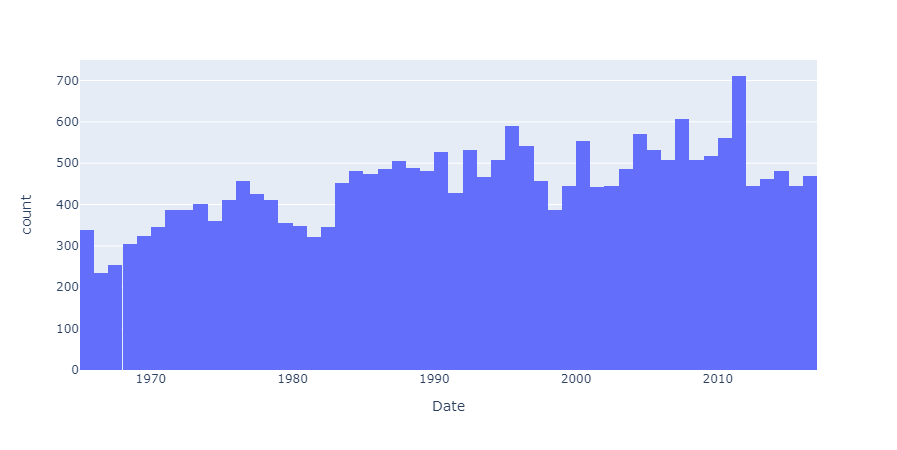

In [7]:
fig = px.histogram(datas, x="Date")
fig.show()

If the `Date` column was converted into `Datetime`, plotly handles it and has automatically set the number of bins such that the counts are made by year. This makes the histogram easily readable.

In the following, you will create customized plots with ```plotly.graph_objects``` to display more accurate information about the number of events.

5. With ```plotly.graph_objects```, create a histogram with a range slider such that you can visualize the daily number of events

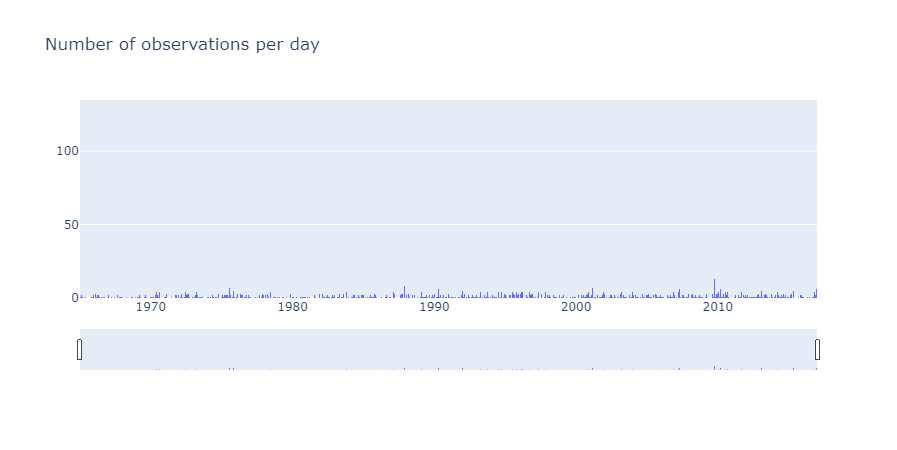

In [8]:
fig = go.Figure(data=[go.Histogram(x=datas.Date,
                                   autobinx=False, 
                                   xbins=dict(size='D'))], 
                layout=go.Layout(
                    title=go.layout.Title(text="Number of observations per day")))
fig.update_xaxes(rangeslider_visible=True)

fig.show()

6. **Optional** We would like to check if there's some seasonality in the number of events. 

Create new columns in the dataset:
- ```Month```
- ```Year``` 

Then use plotly's `make_subplots` function to display the monthly number of observations over a given year, independently for each of the five last years (so, there will be 5 independent historgrams)

In [9]:
datetimeindex = pd.DatetimeIndex(datas.Date)
datas["Year"] = datetimeindex.year
datas["Month"] = datetimeindex.month
display(datas)

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status,Year,Month
0,1965-01-02,13:44:18,19.2460,145.6160,Earthquake,131.60,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
1,1965-01-04,11:29:49,1.8630,127.3520,Earthquake,80.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
2,1965-01-05,18:05:58,-20.5790,-173.9720,Earthquake,20.00,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
3,1965-01-08,18:49:43,-59.0760,-23.5570,Earthquake,15.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
4,1965-01-09,13:32:50,11.9380,126.4270,Earthquake,15.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23404,2016-12-28,08:22:12,38.3917,-118.8941,Earthquake,12.30,1.2,40.0,5.6,ML,...,0.120,NaN,0.1898,NN00570710,NN,NN,NN,Reviewed,2016,12
23405,2016-12-28,09:13:47,38.3777,-118.8957,Earthquake,8.80,2.0,33.0,5.5,ML,...,0.129,NaN,0.2187,NN00570744,NN,NN,NN,Reviewed,2016,12
23406,2016-12-28,12:38:51,36.9179,140.4262,Earthquake,10.00,1.8,NaN,5.9,MWW,...,0.992,4.8,1.5200,US10007NAF,US,US,US,Reviewed,2016,12
23407,2016-12-29,22:30:19,-9.0283,118.6639,Earthquake,79.00,1.8,NaN,6.3,MWW,...,3.553,6.0,1.4300,US10007NL0,US,US,US,Reviewed,2016,12


In [10]:
display(datas.Year.unique())

array([1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975,
       1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986,
       1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016])

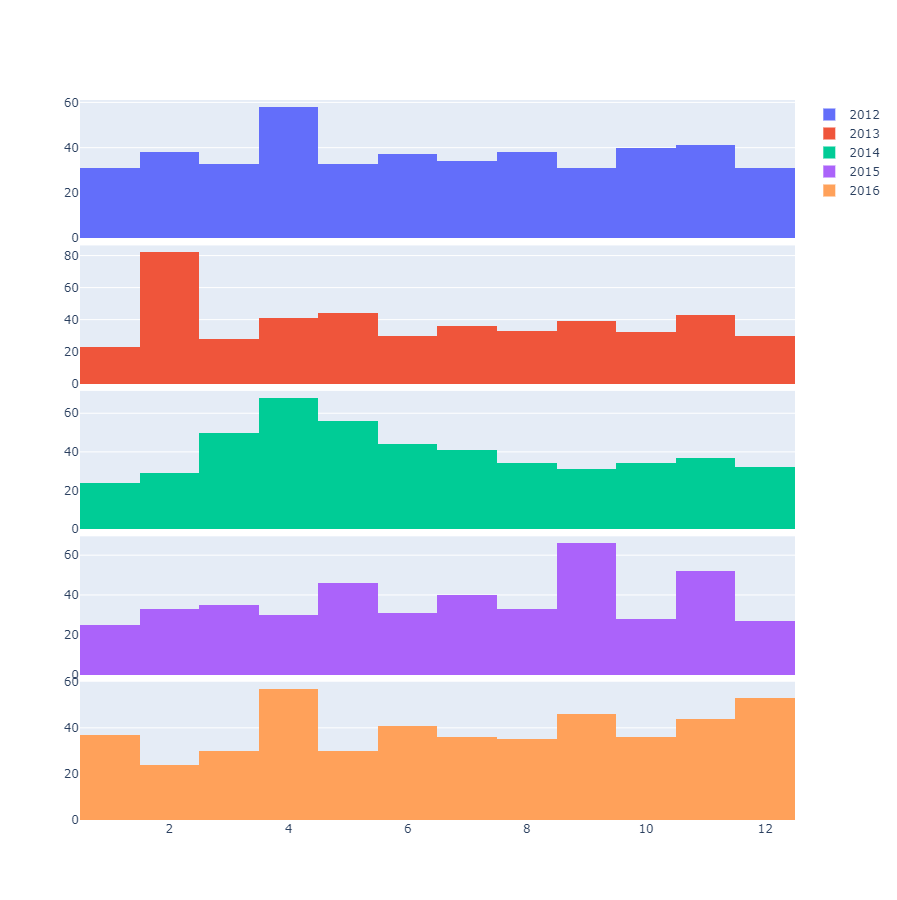

7. **Optional** Now, we would like to allow the user to choose a specific year among the five last years, and display the daily number of observations fot this year only. Use the `Updatemenu` and `Button` classes together with `add_trace` to create an interactive visualization. 

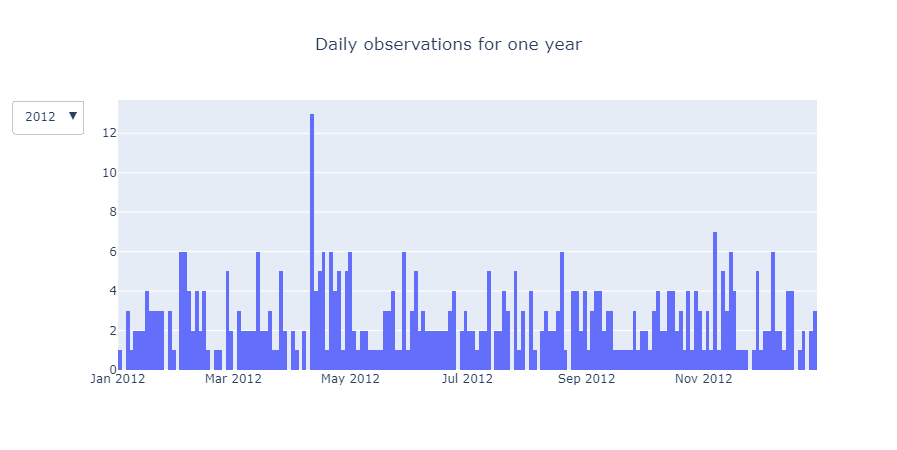

## Focusing on earthquakes

8. Use ```plotly express``` to display the proportion of each type of events in the dataset

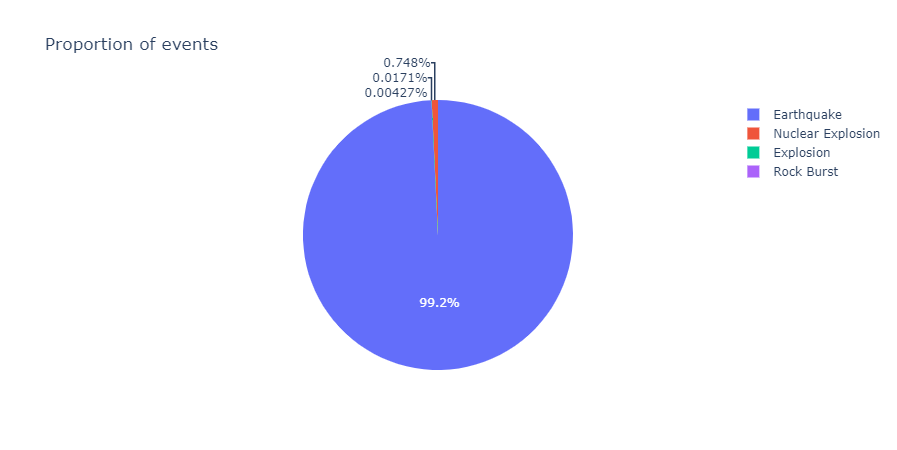

In [10]:
test = datas.Type.value_counts().reset_index()
fig = px.pie(values=test.Type, names=test["index"], title='Proportion of events')
fig.show()

9. Create a new dataset containing only earthquakes and plot the distribution of their magnitudes depths

In [17]:
eartquakes = datas[datas["Type"] == "Earthquake"]
eartquakes.head()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status,Year,Month
0,1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
1,1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
2,1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
3,1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
4,1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1


Let's make some histograms to understand our datas:
- The count by ```Magnitude```
- The count by ```Depth```

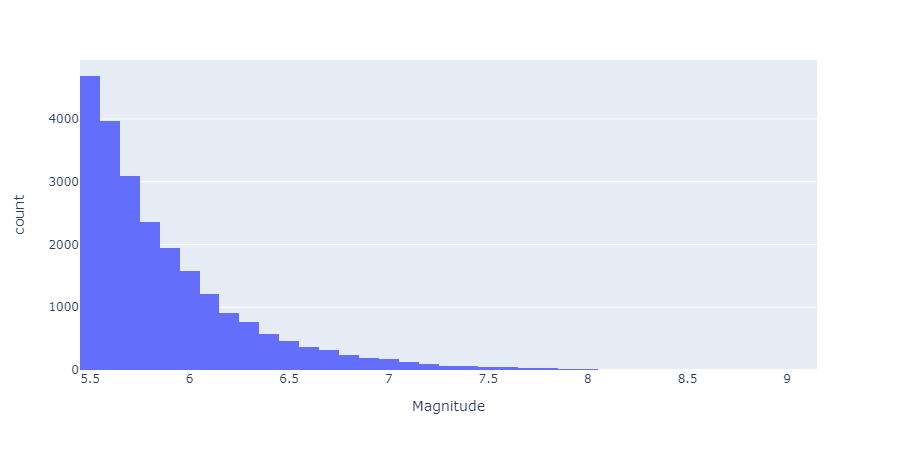

In [12]:
fig = px.histogram(datas, x="Magnitude")
fig.update_traces(xbins=dict(size=0.1))
fig.show()

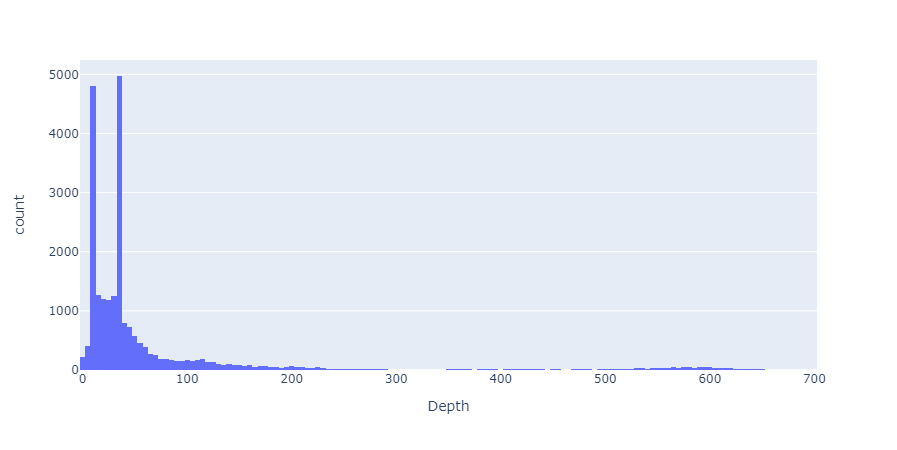

In [13]:
fig = px.histogram(datas, x="Depth")
fig.show()

10. Now, we'd like to explore the evolution of the magnitudes as a function of time :


- Create a dataframe containing the mean magnitudes per day
- Then use this dataset to display the mean magnitudes per day, with a range slider allowing the user to navigate among the dates
- **Optional** Add a reference line showing the value of the mean magnitude computed over the whole dataset


In [14]:
magnitude = datas.groupby("Date")["Magnitude"].mean().reset_index()
magnitude.head()

,Date,Magnitude
0,1965-01-02,6.0
1,1965-01-04,5.8
2,1965-01-05,6.2
3,1965-01-08,5.8
4,1965-01-09,5.8


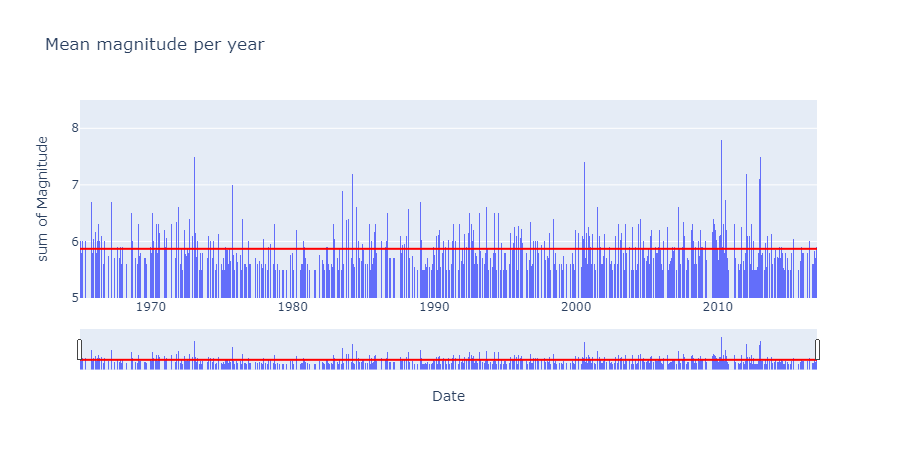

In [15]:
fig = px.histogram(magnitude, x="Date", y="Magnitude", title='Mean magnitude per year')

fig.update_traces(xbins=dict(size="D"))
fig.update_xaxes(rangeslider_visible=True)
fig.update_yaxes(range=[5, 8.5])
fig.add_trace(
    go.Scatter(
        x=[magnitude.Date.min(), magnitude.Date.max()],
        y=[magnitude.Magnitude.mean(), magnitude.Magnitude.mean()],
        mode="lines",
        line=go.scatter.Line(color="Red"),
        showlegend=False)
)

fig.show()

In [22]:
px.set_mapbox_access_token(open(".mapbox_token").read())
fig = px.scatter_mapbox(eartquakes, lat="Latitude", lon="Longitude", color="Magnitude", size="Magnitude",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=10, zoom=5)
fig.show()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status,Year,Month
0,1965-01-02,13:44:18,19.2460,145.6160,Earthquake,131.60,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
1,1965-01-04,11:29:49,1.8630,127.3520,Earthquake,80.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
2,1965-01-05,18:05:58,-20.5790,-173.9720,Earthquake,20.00,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
3,1965-01-08,18:49:43,-59.0760,-23.5570,Earthquake,15.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
4,1965-01-09,13:32:50,11.9380,126.4270,Earthquake,15.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23404,2016-12-28,08:22:12,38.3917,-118.8941,Earthquake,12.30,1.2,40.0,5.6,ML,...,0.120,NaN,0.1898,NN00570710,NN,NN,NN,Reviewed,2016,12
23405,2016-12-28,09:13:47,38.3777,-118.8957,Earthquake,8.80,2.0,33.0,5.5,ML,...,0.129,NaN,0.2187,NN00570744,NN,NN,NN,Reviewed,2016,12
23406,2016-12-28,12:38:51,36.9179,140.4262,Earthquake,10.00,1.8,NaN,5.9,MWW,...,0.992,4.8,1.5200,US10007NAF,US,US,US,Reviewed,2016,12
23407,2016-12-29,22:30:19,-9.0283,118.6639,Earthquake,79.00,1.8,NaN,6.3,MWW,...,3.553,6.0,1.4300,US10007NL0,US,US,US,Reviewed,2016,12


To finish, let's visualize the distribution of the earthquakes around the world.

11. Use plotly express' `scatter_mapbox` to display the earthquakes on a map. Change the color of the markers depending on the value of the magnitude. Use the documentation and <a href="https://plotly.com/python/builtin-colorscales/" target="_blank">this page</a> to find a suitable colorscale.

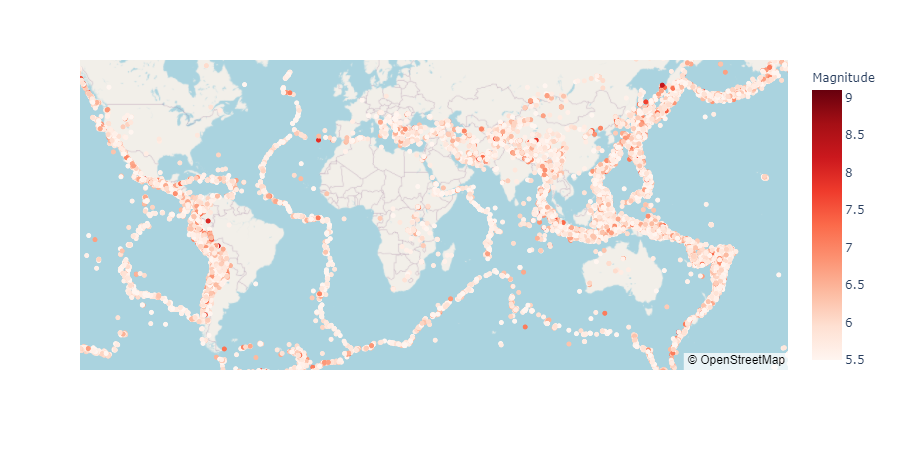

12. Let's make the map animated ! Add some arguments in `scatter_mapbox` to create an animation displaying the earthquakes year by year

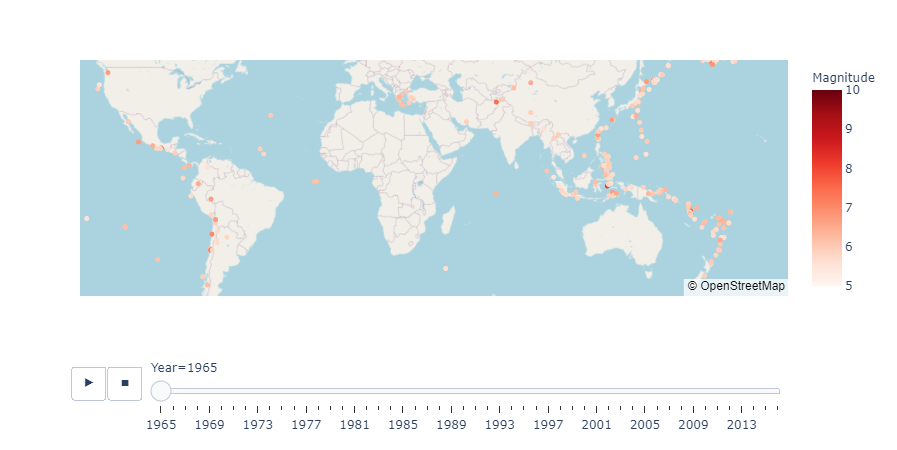

13. **Optional** Look for another function in plotly express that allows to display on a map the *density of earthquakes* (instead of each earthquake separately), and make it animated to display the evolution year by year.

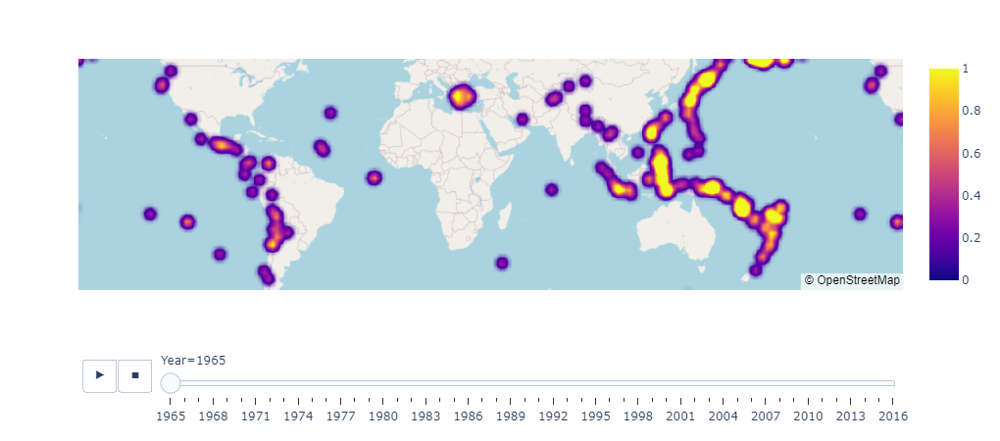